In [ ]:
!pip install opendatasets --upgrade --quiet

ERROR: Operation cancelled by user


In [ ]:
import opendatasets as od

In [ ]:
dataset_url = 'https://www.kaggle.com/ikarus777/best-artworks-of-all-time'

In [ ]:
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: ekta123gupta
Your Kaggle Key: ··········


100%|██████████| 2.29G/2.29G [00:20<00:00, 120MB/s]


In [ ]:
data_dir = '/content/best-artworks-of-all-time/resized/'

In [ ]:
import os

In [ ]:
for cls in os.listdir(data_dir):
  print(cls, ':', len(os.listdir(data_dir + '/' + cls)))

resized : 8683


In [ ]:
from torchvision.datasets import ImageFolder

In [ ]:
dataset = ImageFolder(data_dir)

In [ ]:
len(dataset)

8683

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

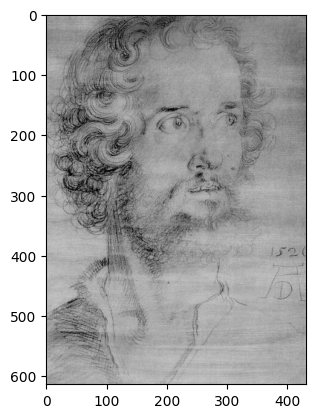

In [ ]:
img, label = dataset[0]
plt.imshow(img)

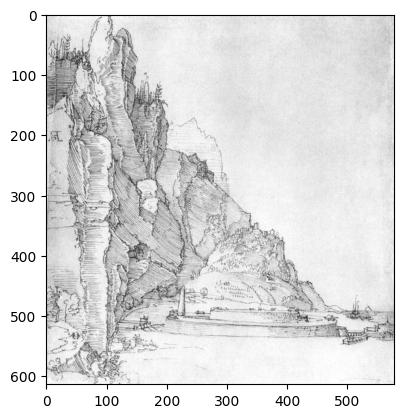

In [ ]:
img, label = dataset[500]
plt.imshow(img)

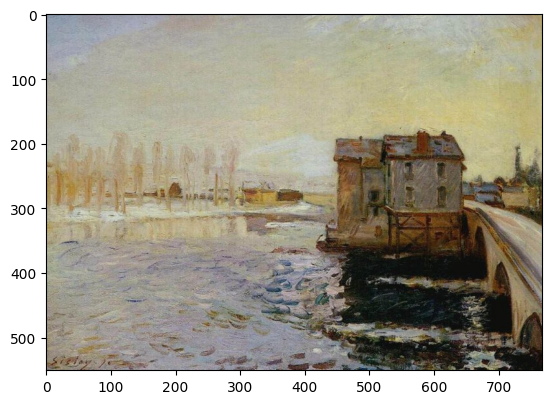

In [ ]:
img, label = dataset[741]
plt.imshow(img)

In [ ]:
import torchvision.transforms as tt
from torch.utils.data import DataLoader

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(data_dir, transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
from torchvision.utils import make_grid

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

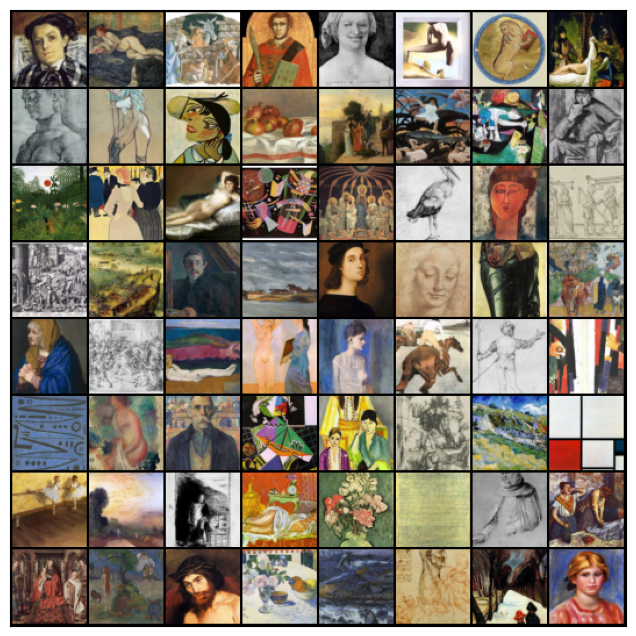

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
import torch

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


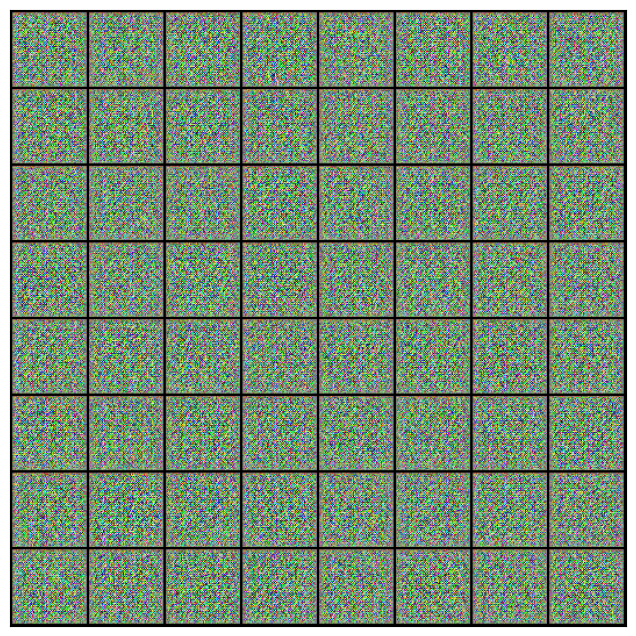

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


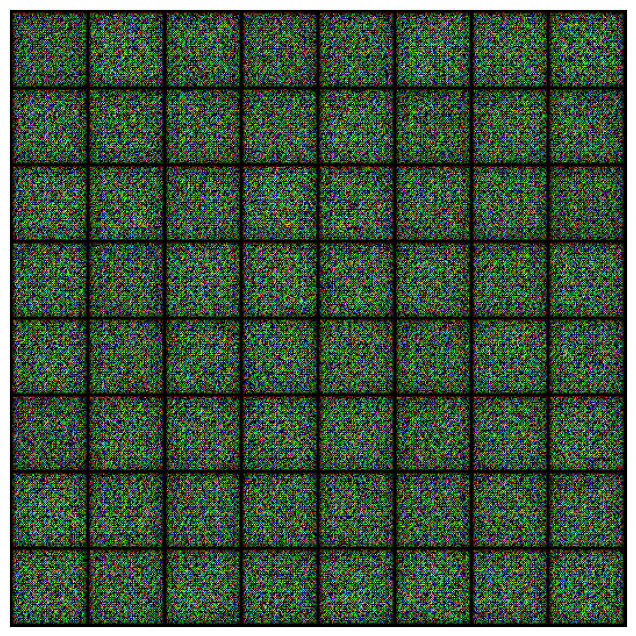

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 200

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [1/200], loss_g: 3.2360, loss_d: 0.3026, real_score: 0.8384, fake_score: 0.0965
Saving generated-images-0001.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [2/200], loss_g: 7.0900, loss_d: 0.5925, real_score: 0.9947, fake_score: 0.3938
Saving generated-images-0002.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [3/200], loss_g: 6.1142, loss_d: 0.6419, real_score: 0.9796, fake_score: 0.3833
Saving generated-images-0003.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [4/200], loss_g: 5.3242, loss_d: 0.0889, real_score: 0.9600, fake_score: 0.0435
Saving generated-images-0004.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [5/200], loss_g: 4.2936, loss_d: 0.4145, real_score: 0.9829, fake_score: 0.2893
Saving generated-images-0005.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [6/200], loss_g: 4.2918, loss_d: 0.0623, real_score: 0.9869, fake_score: 0.0444
Saving generated-images-0006.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [7/200], loss_g: 4.0166, loss_d: 0.1780, real_score: 0.9181, fake_score: 0.0807
Saving generated-images-0007.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [8/200], loss_g: 4.2393, loss_d: 0.1647, real_score: 0.9817, fake_score: 0.1203
Saving generated-images-0008.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [9/200], loss_g: 3.0680, loss_d: 0.1327, real_score: 0.9212, fake_score: 0.0447
Saving generated-images-0009.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [10/200], loss_g: 0.6193, loss_d: 3.1712, real_score: 0.1092, fake_score: 0.0002
Saving generated-images-0010.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [11/200], loss_g: 2.5716, loss_d: 0.3867, real_score: 0.8029, fake_score: 0.1255
Saving generated-images-0011.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [12/200], loss_g: 5.7829, loss_d: 0.4057, real_score: 0.9976, fake_score: 0.3005
Saving generated-images-0012.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [13/200], loss_g: 3.9151, loss_d: 0.3706, real_score: 0.9083, fake_score: 0.1913
Saving generated-images-0013.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [14/200], loss_g: 4.0232, loss_d: 0.0565, real_score: 0.9931, fake_score: 0.0460
Saving generated-images-0014.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [15/200], loss_g: 4.2681, loss_d: 0.0505, real_score: 0.9747, fake_score: 0.0235
Saving generated-images-0015.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [16/200], loss_g: 2.8852, loss_d: 0.1157, real_score: 0.9363, fake_score: 0.0427
Saving generated-images-0016.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [17/200], loss_g: 3.4079, loss_d: 0.0868, real_score: 0.9698, fake_score: 0.0505
Saving generated-images-0017.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [18/200], loss_g: 3.9204, loss_d: 0.1884, real_score: 0.8699, fake_score: 0.0353
Saving generated-images-0018.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [19/200], loss_g: 3.8927, loss_d: 0.1451, real_score: 0.9084, fake_score: 0.0417
Saving generated-images-0019.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [20/200], loss_g: 4.1040, loss_d: 0.2046, real_score: 0.9755, fake_score: 0.1471
Saving generated-images-0020.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [21/200], loss_g: 5.0260, loss_d: 0.0438, real_score: 0.9988, fake_score: 0.0408
Saving generated-images-0021.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [22/200], loss_g: 4.3764, loss_d: 0.1379, real_score: 0.8853, fake_score: 0.0062
Saving generated-images-0022.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [23/200], loss_g: 0.3727, loss_d: 4.5447, real_score: 0.0587, fake_score: 0.0005
Saving generated-images-0023.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [24/200], loss_g: 4.2988, loss_d: 0.4444, real_score: 0.9208, fake_score: 0.2181
Saving generated-images-0024.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [25/200], loss_g: 4.0219, loss_d: 0.2411, real_score: 0.8736, fake_score: 0.0805
Saving generated-images-0025.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [26/200], loss_g: 4.7931, loss_d: 0.2208, real_score: 0.9622, fake_score: 0.1490
Saving generated-images-0026.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [27/200], loss_g: 4.6099, loss_d: 0.1014, real_score: 0.9559, fake_score: 0.0508
Saving generated-images-0027.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [28/200], loss_g: 6.2100, loss_d: 0.0612, real_score: 0.9911, fake_score: 0.0458
Saving generated-images-0028.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [29/200], loss_g: 5.4102, loss_d: 0.1938, real_score: 0.9776, fake_score: 0.1413
Saving generated-images-0029.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [30/200], loss_g: 0.0177, loss_d: 1.8976, real_score: 0.2459, fake_score: 0.0022
Saving generated-images-0030.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [31/200], loss_g: 2.8217, loss_d: 0.2431, real_score: 0.8639, fake_score: 0.0712
Saving generated-images-0031.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [32/200], loss_g: 3.2599, loss_d: 0.1318, real_score: 0.9758, fake_score: 0.0941
Saving generated-images-0032.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [33/200], loss_g: 4.6035, loss_d: 0.0837, real_score: 0.9784, fake_score: 0.0576
Saving generated-images-0033.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [34/200], loss_g: 6.5084, loss_d: 0.0576, real_score: 0.9693, fake_score: 0.0246
Saving generated-images-0034.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [35/200], loss_g: 3.8607, loss_d: 0.0996, real_score: 0.9437, fake_score: 0.0386
Saving generated-images-0035.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [36/200], loss_g: 2.5994, loss_d: 0.1625, real_score: 0.8813, fake_score: 0.0273
Saving generated-images-0036.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [37/200], loss_g: 2.0745, loss_d: 0.9115, real_score: 0.5782, fake_score: 0.0772
Saving generated-images-0037.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [38/200], loss_g: 1.7527, loss_d: 0.4239, real_score: 0.7172, fake_score: 0.0256
Saving generated-images-0038.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [39/200], loss_g: 3.6343, loss_d: 0.0946, real_score: 0.9499, fake_score: 0.0389
Saving generated-images-0039.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [40/200], loss_g: 3.8595, loss_d: 0.0753, real_score: 0.9986, fake_score: 0.0684
Saving generated-images-0040.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [41/200], loss_g: 5.5585, loss_d: 0.0489, real_score: 0.9753, fake_score: 0.0219
Saving generated-images-0041.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [42/200], loss_g: 5.0191, loss_d: 0.0501, real_score: 0.9690, fake_score: 0.0176
Saving generated-images-0042.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [43/200], loss_g: 5.6216, loss_d: 0.0238, real_score: 0.9987, fake_score: 0.0217
Saving generated-images-0043.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [44/200], loss_g: 5.4246, loss_d: 0.0423, real_score: 0.9940, fake_score: 0.0344
Saving generated-images-0044.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [45/200], loss_g: 5.7897, loss_d: 0.1397, real_score: 0.9671, fake_score: 0.0925
Saving generated-images-0045.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [46/200], loss_g: 3.5460, loss_d: 0.3019, real_score: 0.8955, fake_score: 0.1461
Saving generated-images-0046.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [47/200], loss_g: 5.3358, loss_d: 0.2540, real_score: 0.9955, fake_score: 0.2032
Saving generated-images-0047.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [48/200], loss_g: 2.7518, loss_d: 0.1270, real_score: 0.9877, fake_score: 0.1006
Saving generated-images-0048.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [49/200], loss_g: 3.4330, loss_d: 0.1285, real_score: 0.9466, fake_score: 0.0652
Saving generated-images-0049.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [50/200], loss_g: 5.3173, loss_d: 0.1208, real_score: 0.9280, fake_score: 0.0393
Saving generated-images-0050.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [51/200], loss_g: 4.4310, loss_d: 0.1063, real_score: 0.9477, fake_score: 0.0489
Saving generated-images-0051.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [52/200], loss_g: 4.1861, loss_d: 0.0640, real_score: 0.9735, fake_score: 0.0349
Saving generated-images-0052.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [53/200], loss_g: 4.2356, loss_d: 0.4241, real_score: 0.9826, fake_score: 0.2806
Saving generated-images-0053.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [54/200], loss_g: 5.1638, loss_d: 0.0389, real_score: 0.9958, fake_score: 0.0332
Saving generated-images-0054.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [55/200], loss_g: 5.2743, loss_d: 0.0748, real_score: 0.9424, fake_score: 0.0131
Saving generated-images-0055.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [56/200], loss_g: 4.6297, loss_d: 0.0398, real_score: 0.9848, fake_score: 0.0235
Saving generated-images-0056.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [57/200], loss_g: 5.6827, loss_d: 0.0692, real_score: 0.9987, fake_score: 0.0615
Saving generated-images-0057.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [58/200], loss_g: 5.4896, loss_d: 0.0576, real_score: 0.9654, fake_score: 0.0199
Saving generated-images-0058.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [59/200], loss_g: 4.5798, loss_d: 0.0527, real_score: 0.9954, fake_score: 0.0449
Saving generated-images-0059.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [60/200], loss_g: 4.6199, loss_d: 0.0393, real_score: 0.9962, fake_score: 0.0339
Saving generated-images-0060.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [61/200], loss_g: 1.1613, loss_d: 14.9378, real_score: 0.0001, fake_score: 0.0000
Saving generated-images-0061.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [62/200], loss_g: 4.6909, loss_d: 0.2817, real_score: 0.9159, fake_score: 0.1457
Saving generated-images-0062.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [63/200], loss_g: 4.1683, loss_d: 0.1204, real_score: 0.9008, fake_score: 0.0114
Saving generated-images-0063.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [64/200], loss_g: 3.5951, loss_d: 0.2065, real_score: 0.9839, fake_score: 0.1554
Saving generated-images-0064.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [65/200], loss_g: 3.9398, loss_d: 0.1836, real_score: 0.8574, fake_score: 0.0145
Saving generated-images-0065.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [66/200], loss_g: 4.4322, loss_d: 0.0945, real_score: 0.9896, fake_score: 0.0753
Saving generated-images-0066.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [67/200], loss_g: 4.3889, loss_d: 0.0733, real_score: 0.9973, fake_score: 0.0640
Saving generated-images-0067.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [68/200], loss_g: 0.2683, loss_d: 0.7092, real_score: 0.5545, fake_score: 0.0102
Saving generated-images-0068.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [69/200], loss_g: 1.7763, loss_d: 0.9641, real_score: 0.4945, fake_score: 0.0039
Saving generated-images-0069.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [70/200], loss_g: 4.6184, loss_d: 0.0476, real_score: 0.9795, fake_score: 0.0258
Saving generated-images-0070.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [71/200], loss_g: 4.5167, loss_d: 0.0964, real_score: 0.9365, fake_score: 0.0276
Saving generated-images-0071.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [72/200], loss_g: 4.8041, loss_d: 0.0777, real_score: 0.9469, fake_score: 0.0203
Saving generated-images-0072.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [73/200], loss_g: 3.5271, loss_d: 0.0783, real_score: 0.9641, fake_score: 0.0388
Saving generated-images-0073.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [74/200], loss_g: 3.8970, loss_d: 0.0794, real_score: 0.9418, fake_score: 0.0170
Saving generated-images-0074.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [75/200], loss_g: 4.1721, loss_d: 0.0674, real_score: 0.9941, fake_score: 0.0572
Saving generated-images-0075.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [76/200], loss_g: 5.5498, loss_d: 0.0328, real_score: 0.9747, fake_score: 0.0068
Saving generated-images-0076.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [77/200], loss_g: 5.1984, loss_d: 0.0354, real_score: 0.9826, fake_score: 0.0172
Saving generated-images-0077.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [78/200], loss_g: 5.5581, loss_d: 0.0462, real_score: 0.9793, fake_score: 0.0238
Saving generated-images-0078.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [79/200], loss_g: 7.3663, loss_d: 0.3254, real_score: 0.9985, fake_score: 0.2405
Saving generated-images-0079.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [80/200], loss_g: 4.3014, loss_d: 0.0615, real_score: 0.9518, fake_score: 0.0109
Saving generated-images-0080.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [81/200], loss_g: 3.4964, loss_d: 1.3466, real_score: 0.8022, fake_score: 0.5230
Saving generated-images-0081.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [82/200], loss_g: 5.6236, loss_d: 0.2680, real_score: 0.8644, fake_score: 0.0713
Saving generated-images-0082.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [83/200], loss_g: 3.6941, loss_d: 0.1732, real_score: 0.9453, fake_score: 0.0983
Saving generated-images-0083.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [84/200], loss_g: 3.7433, loss_d: 0.1466, real_score: 0.9169, fake_score: 0.0515
Saving generated-images-0084.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [85/200], loss_g: 4.6552, loss_d: 0.1446, real_score: 0.9944, fake_score: 0.1134
Saving generated-images-0085.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [86/200], loss_g: 3.8773, loss_d: 0.4052, real_score: 0.9966, fake_score: 0.2701
Saving generated-images-0086.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [87/200], loss_g: 4.1686, loss_d: 0.1639, real_score: 0.9088, fake_score: 0.0523
Saving generated-images-0087.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [88/200], loss_g: 5.6379, loss_d: 0.0503, real_score: 0.9686, fake_score: 0.0174
Saving generated-images-0088.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [89/200], loss_g: 2.9861, loss_d: 0.1498, real_score: 0.9421, fake_score: 0.0717
Saving generated-images-0089.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [90/200], loss_g: 3.4757, loss_d: 0.1412, real_score: 0.8908, fake_score: 0.0183
Saving generated-images-0090.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [91/200], loss_g: 5.2979, loss_d: 0.0431, real_score: 0.9809, fake_score: 0.0225
Saving generated-images-0091.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [92/200], loss_g: 2.8866, loss_d: 0.1754, real_score: 0.8635, fake_score: 0.0117
Saving generated-images-0092.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [93/200], loss_g: 7.8607, loss_d: 0.1044, real_score: 0.9091, fake_score: 0.0031
Saving generated-images-0093.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [94/200], loss_g: 5.5941, loss_d: 0.0180, real_score: 0.9981, fake_score: 0.0157
Saving generated-images-0094.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [95/200], loss_g: 3.9083, loss_d: 0.0451, real_score: 0.9907, fake_score: 0.0331
Saving generated-images-0095.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [96/200], loss_g: 4.5925, loss_d: 0.0348, real_score: 0.9853, fake_score: 0.0193
Saving generated-images-0096.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [97/200], loss_g: 4.0161, loss_d: 0.3435, real_score: 0.9589, fake_score: 0.1921
Saving generated-images-0097.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [98/200], loss_g: 3.5084, loss_d: 0.2952, real_score: 0.7866, fake_score: 0.0124
Saving generated-images-0098.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [99/200], loss_g: 4.6698, loss_d: 0.0981, real_score: 0.9359, fake_score: 0.0268
Saving generated-images-0099.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [100/200], loss_g: 4.6085, loss_d: 0.0793, real_score: 0.9606, fake_score: 0.0361
Saving generated-images-0100.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [101/200], loss_g: 4.8111, loss_d: 0.0421, real_score: 0.9858, fake_score: 0.0263
Saving generated-images-0101.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [102/200], loss_g: 5.4292, loss_d: 0.0343, real_score: 0.9945, fake_score: 0.0274
Saving generated-images-0102.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [103/200], loss_g: 4.5407, loss_d: 0.0542, real_score: 0.9794, fake_score: 0.0319
Saving generated-images-0103.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [104/200], loss_g: 5.0492, loss_d: 0.0580, real_score: 0.9734, fake_score: 0.0281
Saving generated-images-0104.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [105/200], loss_g: 5.5493, loss_d: 0.0440, real_score: 0.9719, fake_score: 0.0148
Saving generated-images-0105.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [106/200], loss_g: 6.6668, loss_d: 0.0803, real_score: 0.9976, fake_score: 0.0726
Saving generated-images-0106.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [107/200], loss_g: 4.4459, loss_d: 0.0587, real_score: 0.9524, fake_score: 0.0088
Saving generated-images-0107.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [108/200], loss_g: 4.6100, loss_d: 1.7371, real_score: 0.7939, fake_score: 0.4870
Saving generated-images-0108.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [109/200], loss_g: 4.7322, loss_d: 0.3035, real_score: 0.8995, fake_score: 0.1249
Saving generated-images-0109.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [110/200], loss_g: 4.2639, loss_d: 0.1009, real_score: 0.9653, fake_score: 0.0576
Saving generated-images-0110.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [111/200], loss_g: 3.1694, loss_d: 0.2344, real_score: 0.8262, fake_score: 0.0141
Saving generated-images-0111.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [112/200], loss_g: 6.3459, loss_d: 0.1306, real_score: 0.9789, fake_score: 0.0838
Saving generated-images-0112.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [113/200], loss_g: 2.6196, loss_d: 0.0771, real_score: 0.9795, fake_score: 0.0507
Saving generated-images-0113.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [114/200], loss_g: 1.9362, loss_d: 0.3237, real_score: 0.7651, fake_score: 0.0160
Saving generated-images-0114.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [115/200], loss_g: 6.6836, loss_d: 0.1171, real_score: 0.9687, fake_score: 0.0765
Saving generated-images-0115.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [116/200], loss_g: 5.0478, loss_d: 0.0704, real_score: 0.9741, fake_score: 0.0392
Saving generated-images-0116.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [117/200], loss_g: 0.5124, loss_d: 5.0156, real_score: 0.0604, fake_score: 0.0014
Saving generated-images-0117.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [118/200], loss_g: 4.8350, loss_d: 0.0588, real_score: 0.9840, fake_score: 0.0395
Saving generated-images-0118.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [119/200], loss_g: 5.0483, loss_d: 0.0622, real_score: 0.9730, fake_score: 0.0327
Saving generated-images-0119.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [120/200], loss_g: 4.5521, loss_d: 0.0510, real_score: 0.9903, fake_score: 0.0393
Saving generated-images-0120.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [121/200], loss_g: 2.7634, loss_d: 0.2300, real_score: 0.8197, fake_score: 0.0086
Saving generated-images-0121.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [122/200], loss_g: 4.9785, loss_d: 0.0501, real_score: 0.9872, fake_score: 0.0354
Saving generated-images-0122.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [123/200], loss_g: 4.2873, loss_d: 0.1114, real_score: 0.9066, fake_score: 0.0093
Saving generated-images-0123.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [124/200], loss_g: 6.1065, loss_d: 0.0320, real_score: 0.9889, fake_score: 0.0201
Saving generated-images-0124.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [125/200], loss_g: 5.6456, loss_d: 0.0117, real_score: 0.9975, fake_score: 0.0092
Saving generated-images-0125.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [126/200], loss_g: 5.1507, loss_d: 0.0601, real_score: 0.9971, fake_score: 0.0539
Saving generated-images-0126.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [127/200], loss_g: 5.7364, loss_d: 0.0134, real_score: 0.9942, fake_score: 0.0075
Saving generated-images-0127.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [128/200], loss_g: 4.4418, loss_d: 0.1112, real_score: 0.9099, fake_score: 0.0116
Saving generated-images-0128.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [129/200], loss_g: 1.7769, loss_d: 0.2644, real_score: 0.7886, fake_score: 0.0039
Saving generated-images-0129.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [130/200], loss_g: 5.7508, loss_d: 0.0227, real_score: 0.9917, fake_score: 0.0139
Saving generated-images-0130.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [131/200], loss_g: 5.9047, loss_d: 0.0236, real_score: 0.9882, fake_score: 0.0114
Saving generated-images-0131.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [132/200], loss_g: 6.9144, loss_d: 0.0125, real_score: 0.9959, fake_score: 0.0083
Saving generated-images-0132.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [133/200], loss_g: 5.2594, loss_d: 0.0241, real_score: 0.9989, fake_score: 0.0225
Saving generated-images-0133.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [134/200], loss_g: 4.6393, loss_d: 0.0332, real_score: 0.9747, fake_score: 0.0072
Saving generated-images-0134.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [135/200], loss_g: 1.0253, loss_d: 1.2520, real_score: 0.5718, fake_score: 0.3959
Saving generated-images-0135.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [136/200], loss_g: 1.9876, loss_d: 1.2492, real_score: 0.7026, fake_score: 0.4755
Saving generated-images-0136.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [137/200], loss_g: 1.9844, loss_d: 1.1764, real_score: 0.6422, fake_score: 0.3403
Saving generated-images-0137.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [138/200], loss_g: 1.9913, loss_d: 1.0092, real_score: 0.7200, fake_score: 0.3429
Saving generated-images-0138.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [139/200], loss_g: 3.6937, loss_d: 0.3869, real_score: 0.8496, fake_score: 0.1472
Saving generated-images-0139.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [140/200], loss_g: 6.2437, loss_d: 0.3716, real_score: 0.9485, fake_score: 0.2198
Saving generated-images-0140.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [141/200], loss_g: 4.5867, loss_d: 0.1415, real_score: 0.9247, fake_score: 0.0526
Saving generated-images-0141.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [142/200], loss_g: 5.1397, loss_d: 0.0656, real_score: 0.9816, fake_score: 0.0426
Saving generated-images-0142.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [143/200], loss_g: 6.9404, loss_d: 0.0215, real_score: 0.9895, fake_score: 0.0105
Saving generated-images-0143.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [144/200], loss_g: 4.4756, loss_d: 0.0774, real_score: 0.9707, fake_score: 0.0422
Saving generated-images-0144.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [145/200], loss_g: 4.2697, loss_d: 0.0547, real_score: 0.9777, fake_score: 0.0229
Saving generated-images-0145.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [146/200], loss_g: 4.5660, loss_d: 0.1698, real_score: 0.9560, fake_score: 0.1058
Saving generated-images-0146.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [147/200], loss_g: 5.6276, loss_d: 0.0279, real_score: 0.9862, fake_score: 0.0136
Saving generated-images-0147.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [148/200], loss_g: 4.7513, loss_d: 0.0476, real_score: 0.9825, fake_score: 0.0287
Saving generated-images-0148.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [149/200], loss_g: 5.5142, loss_d: 0.0470, real_score: 0.9631, fake_score: 0.0088
Saving generated-images-0149.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [150/200], loss_g: 5.6506, loss_d: 1.4535, real_score: 0.9755, fake_score: 0.5439
Saving generated-images-0150.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [151/200], loss_g: 5.4328, loss_d: 0.0637, real_score: 0.9599, fake_score: 0.0204
Saving generated-images-0151.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [152/200], loss_g: 3.7679, loss_d: 0.1156, real_score: 0.9247, fake_score: 0.0318
Saving generated-images-0152.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [153/200], loss_g: 5.1555, loss_d: 0.0587, real_score: 0.9672, fake_score: 0.0224
Saving generated-images-0153.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [154/200], loss_g: 4.7418, loss_d: 0.0374, real_score: 0.9754, fake_score: 0.0119
Saving generated-images-0154.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [155/200], loss_g: 5.1912, loss_d: 0.0305, real_score: 0.9992, fake_score: 0.0284
Saving generated-images-0155.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [156/200], loss_g: 6.0719, loss_d: 0.0128, real_score: 0.9960, fake_score: 0.0086
Saving generated-images-0156.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [157/200], loss_g: 5.3145, loss_d: 0.0160, real_score: 0.9987, fake_score: 0.0142
Saving generated-images-0157.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [158/200], loss_g: 2.2650, loss_d: 0.8366, real_score: 0.5903, fake_score: 0.0446
Saving generated-images-0158.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [159/200], loss_g: 3.9874, loss_d: 0.2650, real_score: 0.8179, fake_score: 0.0344
Saving generated-images-0159.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [160/200], loss_g: 5.0183, loss_d: 0.0738, real_score: 0.9566, fake_score: 0.0234
Saving generated-images-0160.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [161/200], loss_g: 5.6295, loss_d: 0.0594, real_score: 0.9748, fake_score: 0.0314
Saving generated-images-0161.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [162/200], loss_g: 5.8948, loss_d: 0.0333, real_score: 0.9778, fake_score: 0.0103
Saving generated-images-0162.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [163/200], loss_g: 5.7682, loss_d: 0.0133, real_score: 0.9937, fake_score: 0.0069
Saving generated-images-0163.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [164/200], loss_g: 4.2789, loss_d: 0.0571, real_score: 0.9639, fake_score: 0.0186
Saving generated-images-0164.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [165/200], loss_g: 5.7236, loss_d: 0.0209, real_score: 0.9934, fake_score: 0.0139
Saving generated-images-0165.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [166/200], loss_g: 6.0596, loss_d: 0.0308, real_score: 0.9836, fake_score: 0.0137
Saving generated-images-0166.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [167/200], loss_g: 5.7201, loss_d: 0.0341, real_score: 0.9767, fake_score: 0.0099
Saving generated-images-0167.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [168/200], loss_g: 5.1545, loss_d: 0.1300, real_score: 0.9096, fake_score: 0.0220
Saving generated-images-0168.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [169/200], loss_g: 5.5215, loss_d: 0.0150, real_score: 0.9914, fake_score: 0.0062
Saving generated-images-0169.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [170/200], loss_g: 4.5432, loss_d: 0.0291, real_score: 0.9943, fake_score: 0.0225
Saving generated-images-0170.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [171/200], loss_g: 5.7283, loss_d: 0.0181, real_score: 0.9919, fake_score: 0.0096
Saving generated-images-0171.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [172/200], loss_g: 5.0334, loss_d: 0.0476, real_score: 0.9681, fake_score: 0.0142
Saving generated-images-0172.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [173/200], loss_g: 4.4628, loss_d: 0.0498, real_score: 0.9682, fake_score: 0.0157
Saving generated-images-0173.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [174/200], loss_g: 5.8344, loss_d: 0.0200, real_score: 0.9844, fake_score: 0.0042
Saving generated-images-0174.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [175/200], loss_g: 4.3476, loss_d: 0.1006, real_score: 0.9143, fake_score: 0.0059
Saving generated-images-0175.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [176/200], loss_g: 6.2551, loss_d: 0.0148, real_score: 0.9995, fake_score: 0.0140
Saving generated-images-0176.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [177/200], loss_g: 7.1939, loss_d: 0.0062, real_score: 0.9985, fake_score: 0.0047
Saving generated-images-0177.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [178/200], loss_g: 3.8399, loss_d: 1.0017, real_score: 0.8973, fake_score: 0.3964
Saving generated-images-0178.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [179/200], loss_g: 4.7705, loss_d: 0.3647, real_score: 0.8498, fake_score: 0.1052
Saving generated-images-0179.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [180/200], loss_g: 4.5484, loss_d: 0.1921, real_score: 0.9484, fake_score: 0.1117
Saving generated-images-0180.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [181/200], loss_g: 4.3553, loss_d: 0.0863, real_score: 0.9885, fake_score: 0.0678
Saving generated-images-0181.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [182/200], loss_g: 4.2885, loss_d: 0.0398, real_score: 0.9885, fake_score: 0.0259
Saving generated-images-0182.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [183/200], loss_g: 6.7337, loss_d: 0.0304, real_score: 0.9831, fake_score: 0.0126
Saving generated-images-0183.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [184/200], loss_g: 4.8818, loss_d: 0.0308, real_score: 0.9876, fake_score: 0.0175
Saving generated-images-0184.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [185/200], loss_g: 4.6317, loss_d: 0.0222, real_score: 0.9899, fake_score: 0.0118
Saving generated-images-0185.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [186/200], loss_g: 4.5868, loss_d: 0.0417, real_score: 0.9784, fake_score: 0.0174
Saving generated-images-0186.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [187/200], loss_g: 5.6864, loss_d: 0.0890, real_score: 0.9997, fake_score: 0.0693
Saving generated-images-0187.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [188/200], loss_g: 4.3047, loss_d: 0.0611, real_score: 0.9557, fake_score: 0.0140
Saving generated-images-0188.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [189/200], loss_g: 4.4721, loss_d: 0.0321, real_score: 0.9818, fake_score: 0.0129
Saving generated-images-0189.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [190/200], loss_g: 4.1929, loss_d: 0.0885, real_score: 0.9264, fake_score: 0.0054
Saving generated-images-0190.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [191/200], loss_g: 5.7190, loss_d: 0.0209, real_score: 0.9958, fake_score: 0.0161
Saving generated-images-0191.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [192/200], loss_g: 6.3190, loss_d: 0.0264, real_score: 0.9834, fake_score: 0.0094
Saving generated-images-0192.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [193/200], loss_g: 5.6053, loss_d: 0.0291, real_score: 0.9866, fake_score: 0.0149
Saving generated-images-0193.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [194/200], loss_g: 7.1447, loss_d: 0.0098, real_score: 0.9994, fake_score: 0.0090
Saving generated-images-0194.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [195/200], loss_g: 7.8183, loss_d: 0.6280, real_score: 0.9206, fake_score: 0.2853
Saving generated-images-0195.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [196/200], loss_g: 5.0576, loss_d: 0.1463, real_score: 0.9274, fake_score: 0.0496
Saving generated-images-0196.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [197/200], loss_g: 2.8724, loss_d: 0.2277, real_score: 0.8367, fake_score: 0.0098
Saving generated-images-0197.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [198/200], loss_g: 3.9499, loss_d: 0.1891, real_score: 0.8697, fake_score: 0.0127
Saving generated-images-0198.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [199/200], loss_g: 5.8889, loss_d: 0.0237, real_score: 0.9829, fake_score: 0.0061
Saving generated-images-0199.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [200/200], loss_g: 4.3852, loss_d: 0.0655, real_score: 0.9508, fake_score: 0.0121
Saving generated-images-0200.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

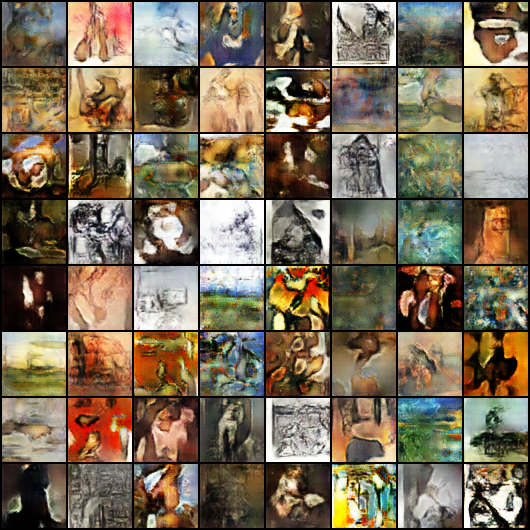

In [ ]:
Image('./generated/generated-images-0001.png')

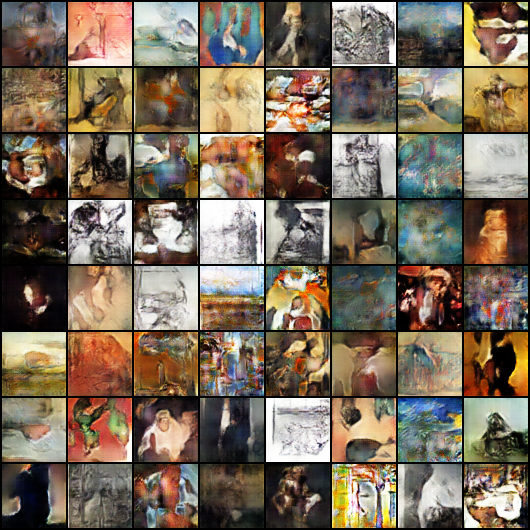

In [ ]:
Image('./generated/generated-images-0031.png')

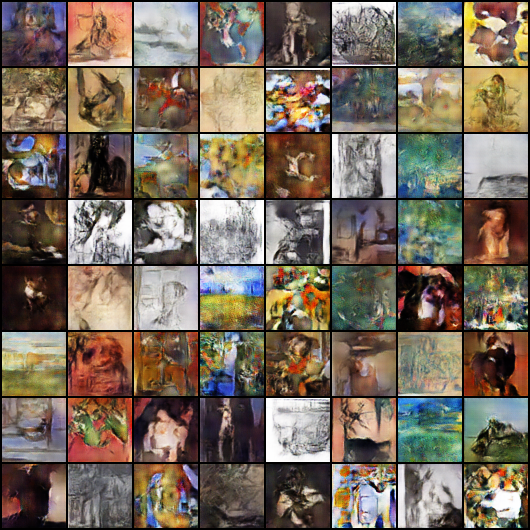

In [ ]:
Image('./generated/generated-images-0090.png')

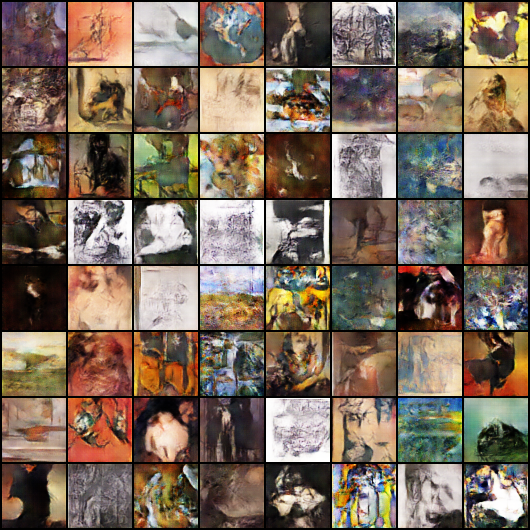

In [ ]:
Image('./generated/generated-images-0141.png')

In [ ]:
import cv2
import os

vid_fname = 'art_gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 5, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()


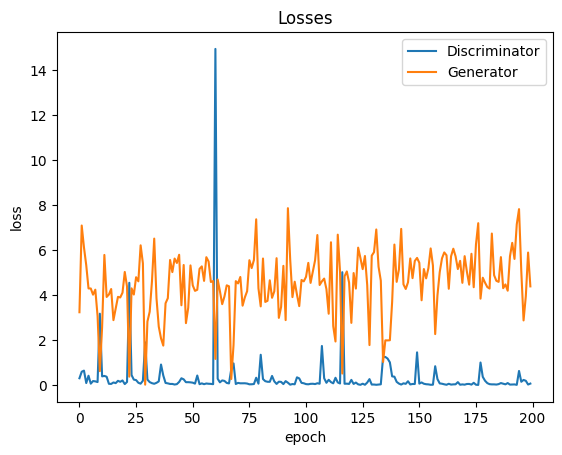

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

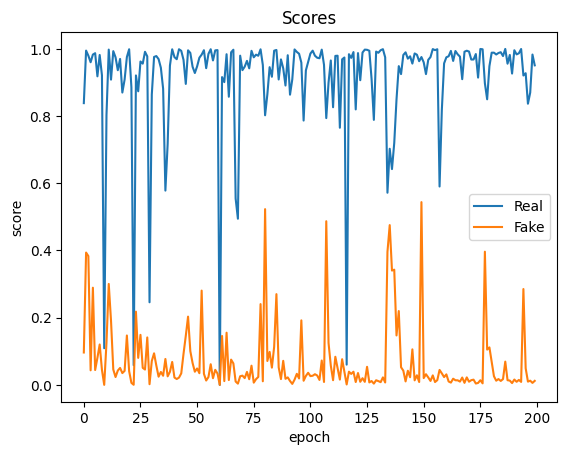

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');